#### Digit Fall Prediction Dataset Tutorial

Welcome to the Digit Fall Prediction Dataset tutorial. Before you begin, make sure you have completed the installation steps and downloaded the dataset. For detailed instructions, please refer to the README.md file.

##### Loading Dataset

In [1]:
# import necessary libraries
import numpy as np
from utils import dataset
from utils import DynamicsCalculator as dc
from utils import vizualize_digit as viz
from matplotlib import animation
import matplotlib.pyplot as plt

The Digit Fall Prediction Dataset is encapsulated within a class. Follow these steps to load the dataset:

In [2]:
# create DatasetLoader instance
dl = dataset.DatasetLoader()
# load dataset
dl.load_dataset(transform_real_trajectories=True,
                remove_hardware_data_after_killed=True,
                subtract_initial_value=False)

Loading position data...
Loading velocity data...
Loading angular momentum data...
Loading time data...
Loading q data...
Loading q dot data...
Loading command torque data...
Loading motor torque measured data...
Filtering data based on force type...


Arguments of ```load_dataset``` function
- ```tranform_real_trajectories```: Transform the data collected with reference to Digit's starting pose as shown in Figure 3 of README.md instead of the world frame
- ```remove_hardware_data_after_killed```: To prevent the Digit robot from getting damaged during
data collection, the hardware data generation is carried out
with Digit attached to a gantry via a slack cable that
allows Digit to move about. Additionally, the motor power
is “killed” when the robot starts to fall, thereby allowing
the gantry to catch it. Set this value to True to discard the data after the motors are killed.
- ```subtract_initial_value```: Set this value to True to subtract the initial value of the data with all the data values at all timesteps.


##### Visualize Trajectories 

Visualizing the data can be extremely helpful. To assist with this, we have provided an animation to visualize the Digit robot's trajectory.

In [3]:
# List all the trajectories in the dataset
print(dl.trajectories)

['sim_fd_1.0_f_8.849612265724774_ft_8.472230850434432_pertb_151.7850064148456.bag', 'sim_fd_1.0_f_13.57953883393604_ft_8.234443525015811_pertb_49.39798078547836.bag', 'sim_fd_1.0_f_38.05842610512571_ft_8.517352635614479_pertb_126.57799170212303.bag', 'sim_fd_1.0_f_28.31599194549956_ft_9.303567252250643_pertb_45.17271543953009.bag', 'sim_fd_1.0_f_46.58244684118178_ft_8.381584972312295_pertb_127.0752159193011.bag', 'sim_fd_1.0_f_12.349255278041083_ft_8.480717913030443_pertb_4.862026101903138.bag', 'sim_fd_1.0_f_37.019539519616224_ft_8.574311048551456_pertb_10.01186272152799.bag', 'sim_fd_1.0_f_51.44426664016296_ft_8.038639173886903_pertb_36.92608659328473.bag', 'sim_fd_1.0_f_32.50622762511768_ft_8.524105785570034_pertb_62.19200911195628.bag', 'sim_fd_1.0_f_16.97304863449756_ft_8.234283468717875_pertb_121.86625508542028.bag', 'sim_fd_1.0_f_12.958565823713636_ft_8.56550876573786_pertb_183.23275781792898.bag', 'sim_fd_1.0_f_41.20350998584638_ft_9.280203402236141_pertb_160.34729067736663.bag

In [4]:
len(dl.q_data["sim_fd_1.0_f_40.088151587814565_ft_9.199487738996039_pertb_137.6519929672542.bag"])

6774

In [5]:
def vizualize_digit3D(q_all):
    """
    Vizualize a trajectory over a 3D plot
    """
    data_dict = {"p_COM":                        np.zeros(shape=(len(q_all), 3)),
                 "p_LeftToeFront":               np.zeros(shape=(len(q_all), 3)),
                 "p_RightToeFront":              np.zeros(shape=(len(q_all), 3)),
                 "p_LeftToeBack":                np.zeros(shape=(len(q_all), 3)),
                 "p_RightToeBack":               np.zeros(shape=(len(q_all), 3)),
                 "p_left_toe_pitch":             np.zeros(shape=(len(q_all), 3)),
                 "p_right_toe_pitch":            np.zeros(shape=(len(q_all), 3)),
                 "p_shin_to_tarsus_left":        np.zeros(shape=(len(q_all), 3)),
                 "p_shin_to_tarsus_right":       np.zeros(shape=(len(q_all), 3)),
                 "p_knee_to_shin_left":          np.zeros(shape=(len(q_all), 3)),
                 "p_knee_to_shin_right":         np.zeros(shape=(len(q_all), 3)),
                 "p_left_knee":                  np.zeros(shape=(len(q_all), 3)),
                 "p_right_knee":                 np.zeros(shape=(len(q_all), 3)),
                 "p_left_hip_pitch":             np.zeros(shape=(len(q_all), 3)),
                 "p_right_hip_pitch":            np.zeros(shape=(len(q_all), 3)),
                 "p_base":                       q_all[:, :3],
                 "p_shoulder_pitch_joint_left":  np.zeros(shape=(len(q_all), 3)),
                 "p_shoulder_pitch_joint_right": np.zeros(shape=(len(q_all), 3)),
                 "p_shoulder_yaw_joint_left":    np.zeros(shape=(len(q_all), 3)),
                 "p_shoulder_yaw_joint_right":   np.zeros(shape=(len(q_all), 3)),
                 "p_elbow_joint_left":           np.zeros(shape=(len(q_all), 3)),
                 "p_elbow_joint_right":          np.zeros(shape=(len(q_all), 3))
                 }
    
    joint_names = list(data_dict.keys())
    
    plot_info = [   # [start_position,                end_position,                  line color]
                    ["p_LeftToeFront",               "p_LeftToeBack",                "black"],
                    ["p_RightToeFront",              "p_RightToeBack",               "black"],
                    ["p_shin_to_tarsus_left",        "p_left_toe_pitch",             "red"],
                    ["p_shin_to_tarsus_right",       "p_right_toe_pitch",            "red"],
                    ["p_knee_to_shin_left",          "p_shin_to_tarsus_left",        "orange"],
                    ["p_knee_to_shin_right",         "p_shin_to_tarsus_right",       "orange"],
                    ["p_left_knee",                  "p_knee_to_shin_left",          "yellow"],
                    ["p_right_knee",                 "p_knee_to_shin_right",         "yellow"],
                    ["p_left_hip_pitch",             "p_left_knee",                  "green"],
                    ["p_right_hip_pitch",            "p_right_knee",                 "green"],
                    ["p_base",                       "p_left_hip_pitch",             "blue"],
                    ["p_base",                       "p_right_hip_pitch",            "blue"],
                    ["p_shoulder_pitch_joint_left",  "p_base",                       "indigo"],
                    ["p_shoulder_pitch_joint_right", "p_base",                       "indigo"],
                    ["p_shoulder_yaw_joint_left",    "p_shoulder_pitch_joint_left",  "slategrey"],
                    ["p_shoulder_yaw_joint_right",   "p_shoulder_pitch_joint_right", "slategrey"],
                    ["p_elbow_joint_left",           "p_shoulder_yaw_joint_left",    "mediumblue"],
                    ["p_elbow_joint_right",          "p_shoulder_yaw_joint_right",   "mediumblue"],
                ]
    
    def update_lines(t, lines, plot_info):
        for line, info in zip(lines, plot_info):
            start_point, end_point, line_color = info
            line.set_data([data_dict.get(start_point)[t, 0], data_dict.get(end_point)[t, 0]],
                          [data_dict.get(start_point)[t, 1], data_dict.get(end_point)[t, 1]])
            line.set_3d_properties([data_dict.get(start_point)[t, 2], data_dict.get(end_point)[t, 2]])
        return lines
    
    # calculate and store all joint positions in a trajectory                   
    for idx, q in enumerate(q_all):
        for joint_name in joint_names:
            if joint_name == "p_base":
                continue
            data_dict[joint_name][idx, :] = dc.get_position(q, joint_name)
            
            
    # index to cut off trajectory if digit robot falls
    cut_off_index = len(q_all)-1
    if data_dict["p_COM"][-1, 2] < 0.5:
        cut_off_index = np.where(data_dict["p_COM"][:, 2] < 0.5)[0][0]
    
    fig = plt.figure()
    axes = fig.add_subplot(projection="3d")

    # Create lines initially without data
    lines = [axes.plot([], [], [])[0] for _ in range(cut_off_index)]
    print("cut off index: ", cut_off_index)


    # Setting the axes properties
    axes.set(xlim3d=(-1, 1), xlabel='X')
    axes.set(ylim3d=(-1, 1), ylabel='Y')
    axes.set(zlim3d=(0, 2), zlabel='Z')

    # Creating the Animation object
    ani = animation.FuncAnimation(
        fig, update_lines, cut_off_index, fargs=(lines, plot_info), interval=100)
    plt.show()
    return ani


cut off index:  119


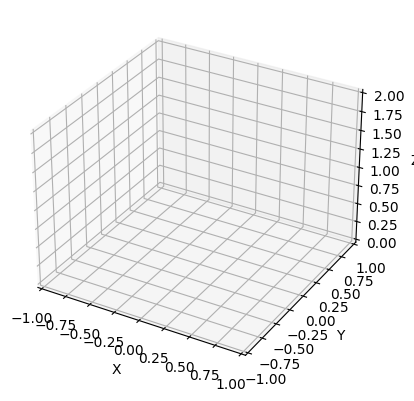

In [6]:
# extract the joint angles data
q_data = dl.q_data

# select a trajectory to visualize
trajectory_name = "sim_fd_1.0_f_40.088151587814565_ft_9.199487738996039_pertb_137.6519929672542.bag"

# Visualize the trajectory
# the q data is sliced at an interval of 20 because of memory limits when creating matplotlib animation
ani = vizualize_digit3D(q_all=q_data[trajectory_name][::20])

In [7]:
from IPython.display import HTML, display

display(HTML(ani.to_jshtml()))


##### Kinematics Calculations of trajectory data

Digit has 62 reference points (e.g., shoulder pitch joint, Center of Mass). In Linux, you can obtain the list of all reference points via the following command:

In [10]:
! find c_functions/c_kin/ -name 'p_*.c' | xargs -I{} basename {} ".c"

p_shoulder_yaw_joint_right
p_left_shoulder_yaw
p_right_hip_yaw
p_right_shoulder_pitch
p_hip_rotation_left
p_left_shoulder_roll
p_left_toe_roll
p_RightToeFront
p_left_hip_yaw
p_right_toe_roll
p_shoulder_pitch_joint_left
p_torso
p_BasePosZ
p_knee_joint_left
p_elbow_joint_right
p_elbow_joint_left
p_hip_abduction_right
p_BaseRotY
p_LeftToeMid
p_right_toe_pitch
p_toe_roll_joint_left
p_right_hip_roll
p_BaseRotZ
p_toe_roll_joint_right
p_hip_flexion_left
p_knee_to_shin_left
p_right_knee
p_BasePosY
p_BaseRotX
p_right_shin
p_right_shoulder_roll
p_right_elbow
p_left_knee
p_shoulder_roll_joint_left
p_right_shoulder_yaw
p_COM
p_BasePosX
p_right_hip_pitch
p_left_hip_pitch
p_left_elbow
p_hip_flexion_right
p_left_toe_pitch
p_hip_abduction_left
p_shoulder_yaw_joint_left
p_toe_pitch_joint_right
p_toe_pitch_joint_left
p_left_shoulder_pitch
p_knee_to_shin_right
p_shin_to_tarsus_left
p_LeftToeFront
p_knee_joint_right
p_shoulder_roll_joint_right
p_RightToeMid
p_shoulder_pitch_joint_right
p_left_hip_roll
p_l

To obtain the position of a reference point given q values, use the ```get_position``` function as demonstrated below:

In [8]:
# calculate the position of a reference point
pos = dc.get_position(q=np.zeros(30), ref_point="p_COM")

To obtain the angular momentum of a reference point given q and q dot values, use the ```get_angular_momentum``` function as demonstrated below:

In [31]:
# calculate angular momentum
ang_mom = dc.get_angular_momentum(q=np.zeros(30), dq=np.zeros(30), custom_point_pos=[1,2, 3], custom_point_vel=[3, 4, 56])